In [2]:
%pip install missingno

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: missingno in c:\users\rajni\anaconda3\lib\site-packages (0.5.2)



In [3]:
import warnings
warnings.simplefilter(action='ignore')
warnings.filterwarnings('ignore')

from collections import Counter

#impoort package
import numpy as np
import pandas as pd

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Algorithm

from sklearn.model_selection import cross_val_score,StratifiedKFold,learning_curve


# Data Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning Models
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# Model Evaluation and Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error



In [5]:
data=pd.read_csv('../fetal_health.csv')

In [6]:
data.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

KeyboardInterrupt: 

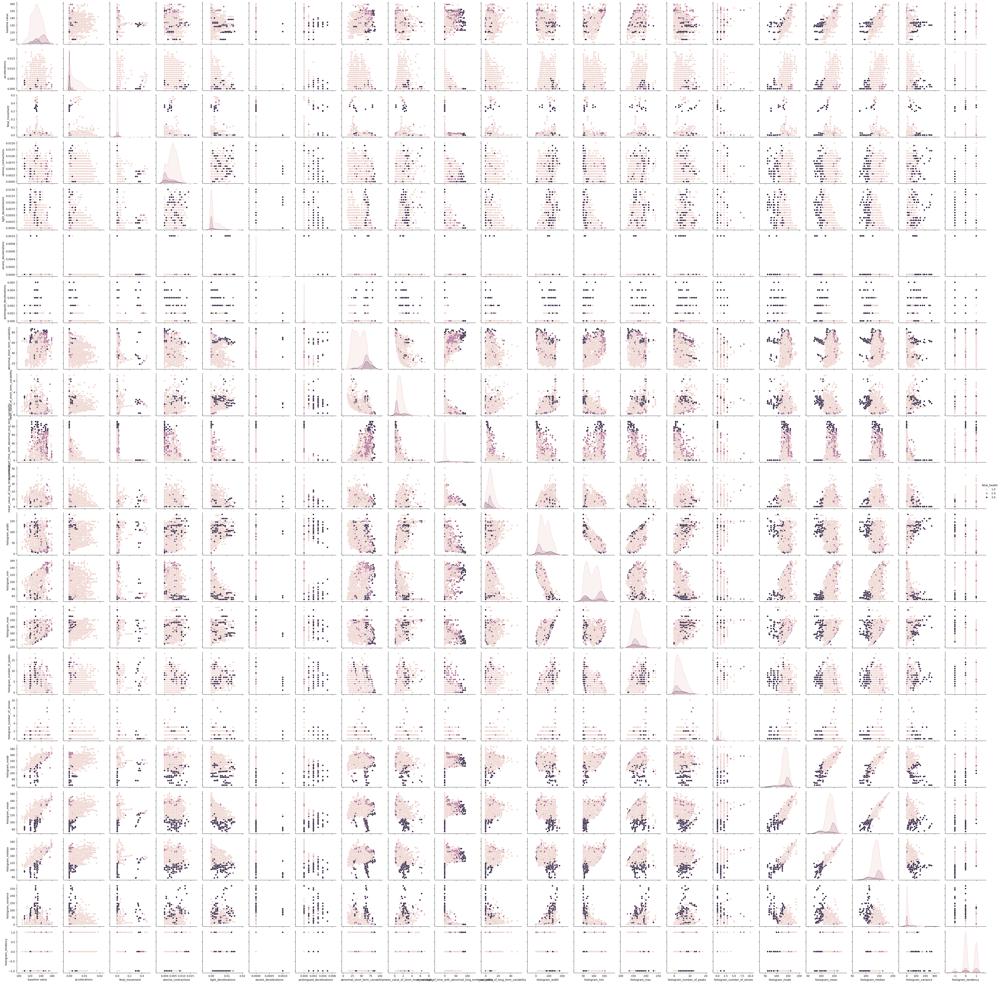

In [8]:
sns.pairplot(data,hue='fetal_health')

In [73]:
data.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

In [88]:
import numpy as np
import pandas as pd
import pickle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix
from imblearn.over_sampling import SMOTE

# Load dataset
data = pd.read_csv("../fetal_health.csv")

# Define feature columns
columns = [
    'baseline value', 'accelerations', 'fetal_movement', 'uterine_contractions',
    'light_decelerations', 'severe_decelerations', 'prolongued_decelerations',
    'abnormal_short_term_variability', 'mean_value_of_short_term_variability',
    'percentage_of_time_with_abnormal_long_term_variability',
    'mean_value_of_long_term_variability', 'histogram_width', 'histogram_min',
    'histogram_max', 'histogram_number_of_peaks', 'histogram_number_of_zeroes',
    'histogram_mode', 'histogram_mean', 'histogram_median', 'histogram_variance',
    'histogram_tendency'
]

# Extract features and target
X = data[columns]
y = data['fetal_health'].astype(int) - 1  # Convert labels to [0, 1, 2]

# Print class distribution before training
print("Class distribution before training:")
print(y.value_counts())

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Save scaler
with open("scaler2.pkl", "wb") as f:
    pickle.dump(scaler, f)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Print class distribution after SMOTE
print("Class distribution after SMOTE:")
print(pd.Series(y_train_balanced).value_counts())

# Train XGBoost model
xgb_model = XGBClassifier(
    eval_metric='mlogloss',
     scale_pos_weight={0: 1, 1: 3, 2: 2},
    random_state=42
)
xgb_model.fit(X_train_balanced, y_train_balanced)

# Model evaluation function
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)
    auc_score = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')
    cm = confusion_matrix(y_test, y_pred)
    specificity = np.mean(cm.diagonal() / cm.sum(axis=1))
    
    return {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='weighted'),
        "Recall": recall_score(y_test, y_pred, average='weighted'),
        "F1-Score": f1_score(y_test, y_pred, average='weighted'),
        "AUC": auc_score,
        "Specificity": specificity
    }

# Evaluate XGBoost model
results = evaluate_model(xgb_model, X_test, y_test)
print("Evaluation Results:")
print(results)

# Save Best Model
with open("best_xgboost.pkl", "wb") as f:
    pickle.dump(xgb_model, f)
print("Saved XGBoost model as Pickle.")


Class distribution before training:
fetal_health
0    1655
1     295
2     176
Name: count, dtype: int64
Class distribution after SMOTE:
fetal_health
1    1158
0    1158
2    1158
Name: count, dtype: int64
Evaluation Results:
{'Accuracy': 0.9420062695924765, 'Precision': 0.9413593978114868, 'Recall': 0.9420062695924765, 'F1-Score': 0.9415926608103494, 'AUC': 0.9835954544619612, 'Specificity': 0.9022192043053058}
Saved XGBoost model as Pickle.


In [85]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((1488, 21), (638, 21), (1488,), (638,))

In [89]:
print(pd.Series(y_train_balanced).value_counts())


fetal_health
1    1158
0    1158
2    1158
Name: count, dtype: int64


In [90]:
from sklearn.metrics import classification_report
y_pred = xgb_model.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.96      0.97      0.97       497
           1       0.83      0.80      0.81        88
           2       0.91      0.94      0.93        53

    accuracy                           0.94       638
   macro avg       0.90      0.90      0.90       638
weighted avg       0.94      0.94      0.94       638

